In [2]:
import pandas as pd
import numpy as numpy
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('data/kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [4]:
df.isnull().sum().sum()

0

In [5]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
id,21597.0,4.580474e+09,2.876736e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21597.0,5.402966e+05,3.673681e+05,7.800000e+04,3.220000e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21597.0,3.373200e+00,9.262989e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21597.0,2.115826e+00,7.689843e-01,5.000000e-01,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21597.0,2.080322e+03,9.181061e+02,3.700000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21597.0,1.509941e+04,4.141264e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068500e+04,1.651359e+06
floors,21597.0,1.494096e+00,5.396828e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21597.0,7.547345e-03,8.654900e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21597.0,2.342918e-01,7.663898e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21597.0,3.409825e+00,6.505456e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


<Figure size 720x720 with 0 Axes>

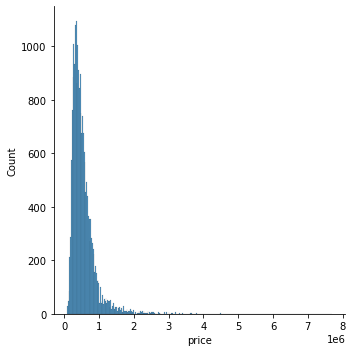

In [6]:
plt.figure(figsize=(10,10))
sns.displot(df['price'])

<AxesSubplot:xlabel='bedrooms', ylabel='count'>

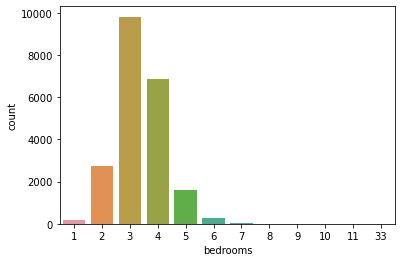

In [7]:
sns.countplot(df['bedrooms'])

In [8]:
# see what is correlated with price
df.corr()['price'].sort_values(ascending=False)

price            1.000000
sqft_living      0.701917
grade            0.667951
sqft_above       0.605368
sqft_living15    0.585241
bathrooms        0.525906
view             0.397370
sqft_basement    0.323799
bedrooms         0.308787
lat              0.306692
waterfront       0.266398
floors           0.256804
yr_renovated     0.126424
sqft_lot         0.089876
sqft_lot15       0.082845
yr_built         0.053953
condition        0.036056
long             0.022036
id              -0.016772
zipcode         -0.053402
Name: price, dtype: float64

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

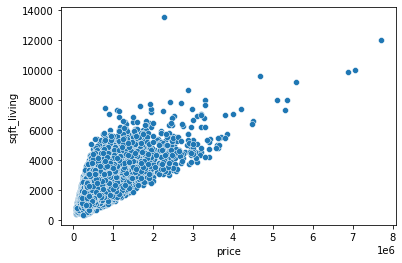

In [9]:
sns.scatterplot(x='price', y='sqft_living', data=df)

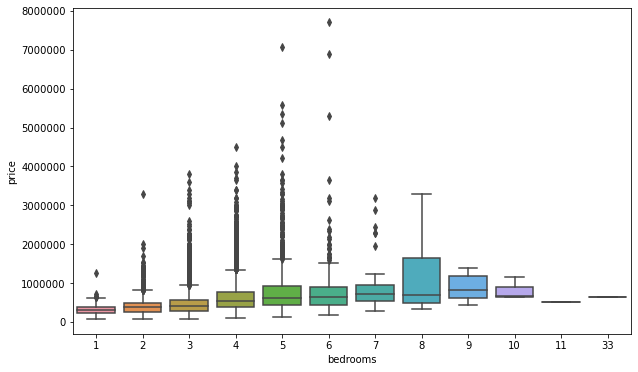

In [10]:
plt.figure(figsize=(10,6))
plt.ticklabel_format(style='plain', axis='y')
ax = sns.boxplot(y=df.price.astype('float'), x='bedrooms', data=df)


<AxesSubplot:xlabel='price', ylabel='long'>

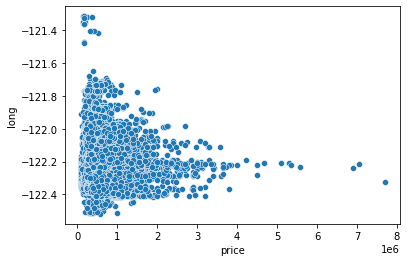

In [11]:
sns.scatterplot(x=df.price, y=df.long)

<AxesSubplot:xlabel='price', ylabel='lat'>

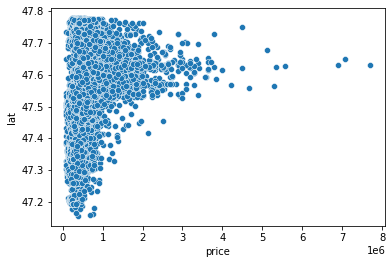

In [12]:
sns.scatterplot(x=df.price, y=df.lat)

In [13]:
# get rid of the expensive outliers
df_subset = df.sort_values('price', ascending=False).iloc[int((len(df)*.01)):]
df_subset.head(10)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
17221,1338600225,5/28/2014,1970000.0,8,3.50,4440,6480,2.0,0,3,...,10,3140,1300,1959,0,98112,47.6310,-122.303,4440,8640
6329,824059321,6/2/2014,1970000.0,4,3.50,4370,8510,2.0,0,1,...,10,3610,760,2003,0,98004,47.5876,-122.204,2960,10347
12271,1923000260,10/15/2014,1960000.0,5,4.50,6200,23373,3.0,0,1,...,11,5050,1150,1988,0,98040,47.5632,-122.215,3700,14486
9166,3124059023,2/13/2015,1960000.0,3,1.75,3330,12566,1.0,1,4,...,8,1940,1390,1960,0,98040,47.5287,-122.220,3730,16560
12565,2806300065,4/22/2015,1960000.0,4,4.00,4430,31353,2.0,0,0,...,12,4430,0,1998,0,98005,47.6422,-122.157,3900,35237
1150,4055701200,4/21/2015,1960000.0,4,2.75,3120,7898,1.0,1,4,...,8,1560,1560,1963,0,98034,47.7165,-122.259,2630,13868
15363,1568100920,4/8/2015,1950000.0,4,2.50,3440,14554,2.0,1,4,...,8,2170,1270,2012,0,98155,47.7364,-122.286,3170,11810
16238,3760500280,10/14/2014,1950000.0,3,2.50,2510,12779,1.5,0,4,...,10,2510,0,1968,0,98034,47.6982,-122.231,2810,12225
18860,4389201241,12/30/2014,1950000.0,4,4.00,4690,6900,2.0,0,0,...,11,3480,1210,2001,0,98004,47.6165,-122.216,2800,11240
19336,2525049113,7/25/2014,1950000.0,4,3.50,4065,18713,2.0,0,0,...,10,4065,0,1987,0,98039,47.6209,-122.237,3070,18713


<AxesSubplot:xlabel='long', ylabel='lat'>

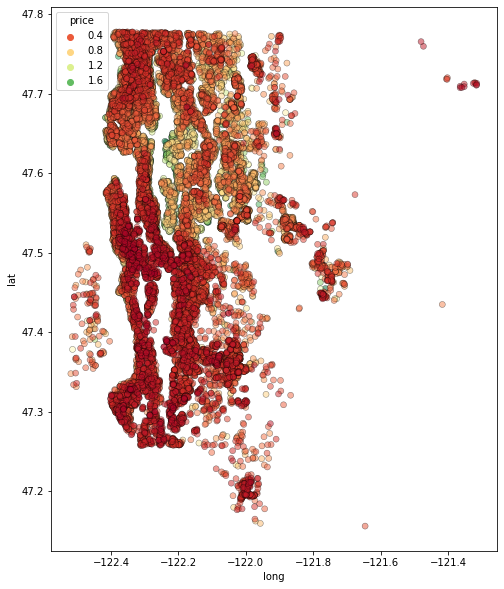

In [14]:
plt.figure(figsize=(8,10))
sns.scatterplot(x=df_subset.long,
                y=df_subset.lat,
                hue=df_subset.price,
                edgecolor= 'black',
                alpha=0.5,
                palette='RdYlGn')

<AxesSubplot:xlabel='waterfront', ylabel='price'>

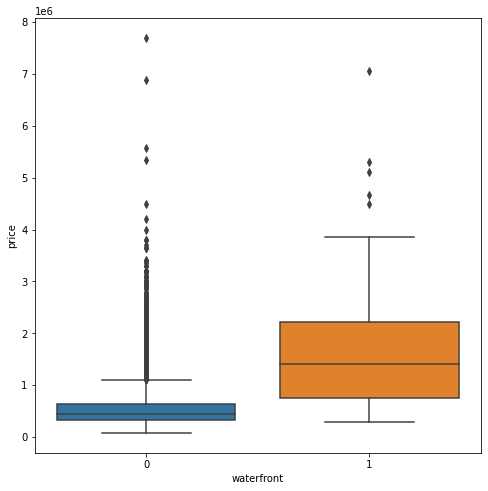

In [15]:
plt.figure(figsize=(8,8))
sns.boxplot(x=df.waterfront, y=df.price)

In [16]:
df = df.drop('id', axis=1)
df['date'] = pd.to_datetime(df['date'])

In [17]:
df['year'] = df['date'].apply(lambda date: date.year)
df['month'] = df['date'].apply(lambda date: date.month)

<AxesSubplot:xlabel='month', ylabel='price'>

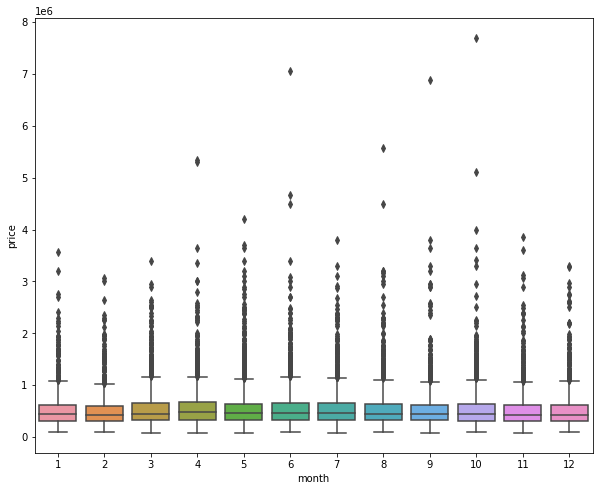

In [18]:
plt.figure(figsize=(10,8))
sns.boxplot(x=df.month, y=df.price)

<AxesSubplot:xlabel='month'>

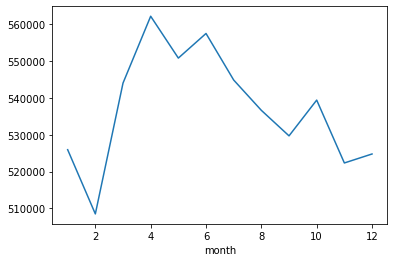

In [19]:
df.groupby('month').mean()['price'].plot()

<AxesSubplot:xlabel='year'>

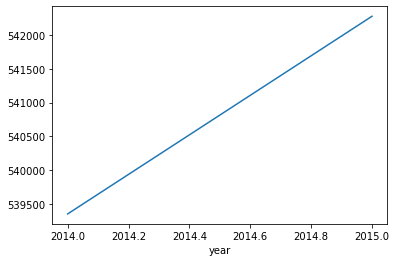

In [20]:
df.groupby('year').mean()['price'].plot()

In [21]:
df = df.drop('date', axis=1)

In [22]:
df.zipcode.value_counts()

98103    602
98038    589
98115    583
98052    574
98117    553
        ... 
98102    104
98010    100
98024     80
98148     57
98039     50
Name: zipcode, Length: 70, dtype: int64

In [23]:
df = df.drop('zipcode',axis=1)

In [24]:
X = df.drop('price', axis=1).values
y = df.price.values

In [25]:
from sklearn.model_selection import train_test_split


In [26]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.30, random_state=101)

In [27]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [28]:
X_train.shape

(15117, 19)

In [29]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

model = Sequential()
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))

model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [30]:
model.fit(x=X_train, y=y_train,\
          validation_data=(X_test, y_test),
          batch_size=128,
          epochs=400
          )

====] - 0s 1ms/step - loss: 30386018304.0000 - val_loss: 28368871424.0000
Epoch 239/400
119/119 [==============================] - 0s 1ms/step - loss: 30354305024.0000 - val_loss: 28347193344.0000
Epoch 240/400
119/119 [==============================] - 0s 1ms/step - loss: 30347216896.0000 - val_loss: 28343744512.0000
Epoch 241/400
119/119 [==============================] - 0s 1ms/step - loss: 30303809536.0000 - val_loss: 28272457728.0000
Epoch 242/400
119/119 [==============================] - 0s 1ms/step - loss: 30304032768.0000 - val_loss: 28261877760.0000
Epoch 243/400
119/119 [==============================] - 0s 1ms/step - loss: 30339356672.0000 - val_loss: 28248723456.0000
Epoch 244/400
119/119 [==============================] - 0s 1ms/step - loss: 30275743744.0000 - val_loss: 28353433600.0000
Epoch 245/400
119/119 [==============================] - 0s 1ms/step - loss: 30262788096.0000 - val_loss: 28237170688.0000
Epoch 246/400
119/119 [==============================] - 0s 1ms/s

<AxesSubplot:>

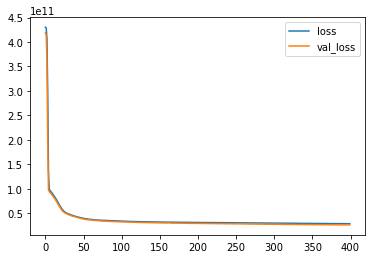

In [31]:
losses = pd.DataFrame(model.history.history)
losses.plot()

In [32]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score
predictions = model.predict(X_test)
mean_squared_error(y_test, predictions)

25945865406.884872

In [33]:
mean_absolute_error(y_test, predictions)

99139.28890094522

In [34]:
df['price'].describe()

count    2.159700e+04
mean     5.402966e+05
std      3.673681e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      7.700000e+06
Name: price, dtype: float64

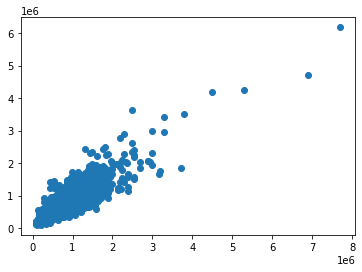

In [35]:
plt.scatter(y_test, predictions)